In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Laboratory 5: Image Filtering

# Linear Filtering

In [2]:
import cv2
import sys

img = cv2.imread("/content/drive/MyDrive/Computer vision/lab5/Images/pout.tif" )

#if img is None:
 #   sys.exit("Could not read the image.")

In [3]:
import matplotlib.pyplot as plt
import numpy as np

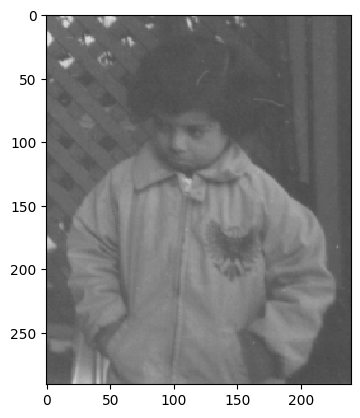

In [ ]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Convolution

### Create your own convolution filters:

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

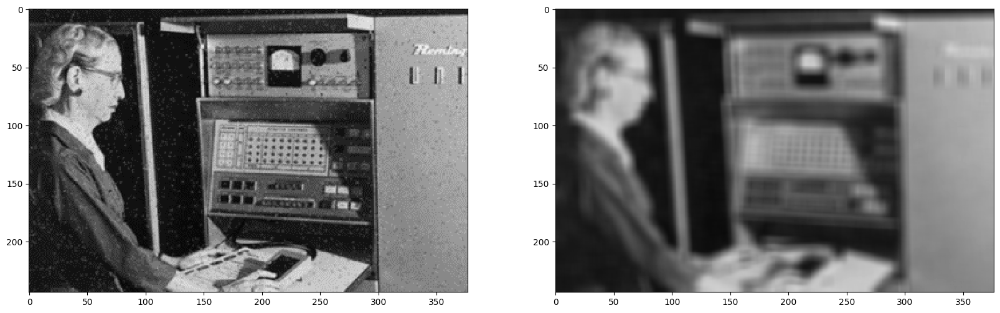

In [ ]:
# Create your own filter
kernel_size = 10

# Add you code here for creating a kernel matrix
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel /= (kernel_size * kernel_size)

img_filtered = cv2.filter2D(img_gray, -1, kernel, cv2.BORDER_DEFAULT)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_filtered, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Check out the flags for border settings here:
https://docs.opencv.org/3.4/d2/de8/group__core__array.html#ga209f2f4869e304c82d07739337eae7c5

## Blur filters (Low pass filters)

### Box filter

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

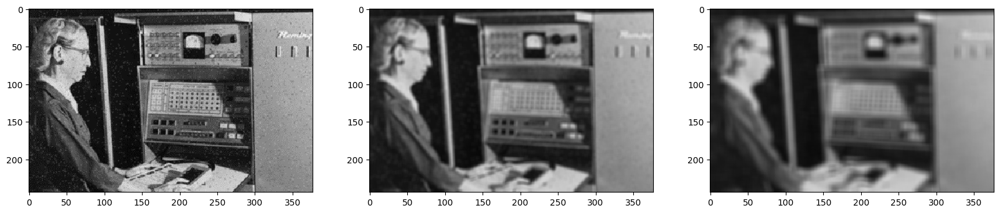

In [ ]:
# Box filter
img_blur_box1 = cv2.blur(img_gray,(5,5))
img_blur_box2 = cv2.blur(img_gray,(10,10))


# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_box1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_box2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Gaussian filter

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

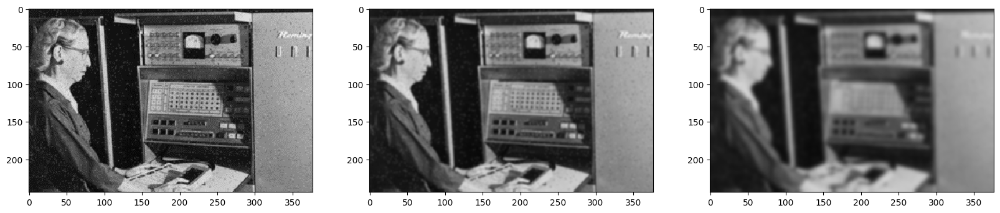

In [ ]:
#gaussian filter
img_blur_gauss1 = cv2.GaussianBlur(img_gray, (5,5), 0)
img_blur_gauss2 = cv2.GaussianBlur(img_gray, (15,15), 0)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_gauss1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_gauss2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Edge detection

### Sobel operators

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

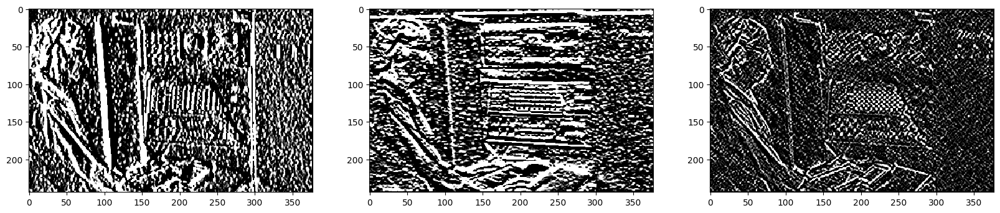

In [ ]:
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_gray, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_gray, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_gray, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(sobelx, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(sobely, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(sobelxy, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Canny edge detector

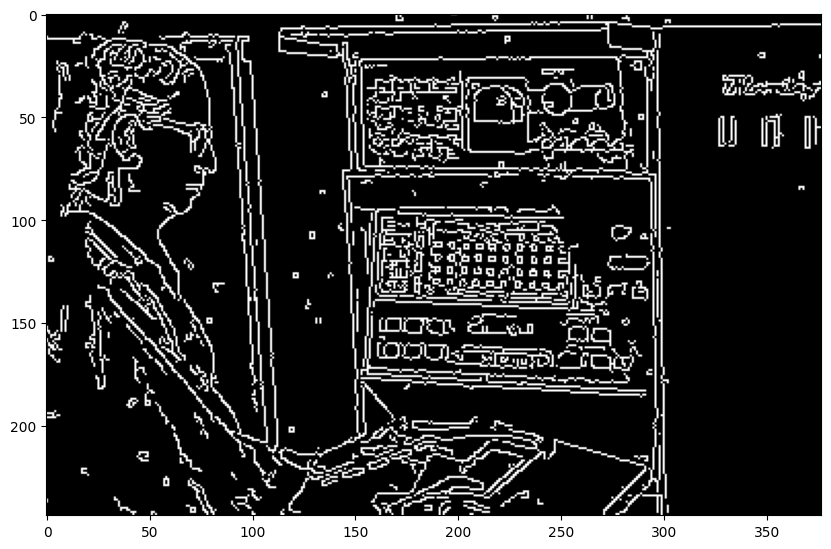

In [ ]:
# Canny Edge Detection
canny_edges = cv2.Canny(image=img_gray, threshold1=100, threshold2=200) # Canny Edge Detection

# display the image
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.imshow(cv2.cvtColor(canny_edges, cv2.COLOR_BGR2RGB))
plt.show()

### Sharpening (Unsharp masking)

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/pout.tif', cv2.IMREAD_GRAYSCALE)

In [ ]:
img_blur_gauss = cv2.GaussianBlur(img_gray, (5,5), 0)

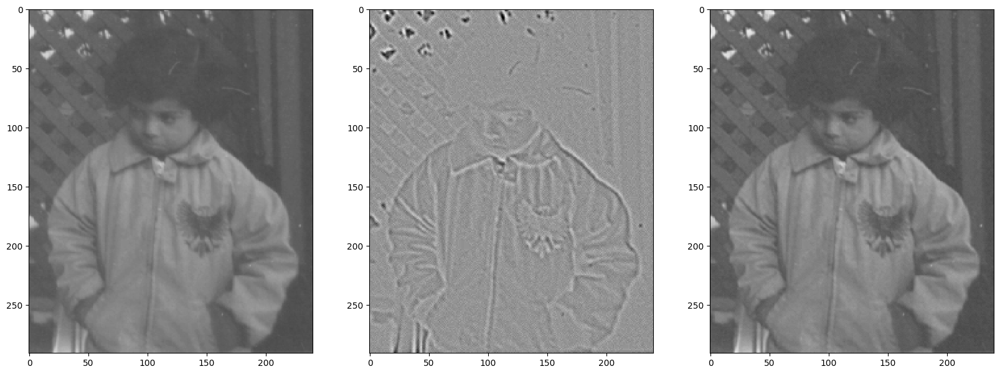

In [ ]:
gamma = 0.7

lap = cv2.Laplacian(img_blur_gauss, cv2.CV_64F)

img_sharp = img_gray - gamma*lap

# display the images
lap_show = np.zeros(lap.shape)
cv2.normalize(lap, lap_show, 0, 255, cv2.NORM_MINMAX)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(lap_show, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_sharp, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Non-linear filters

## Median filter

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

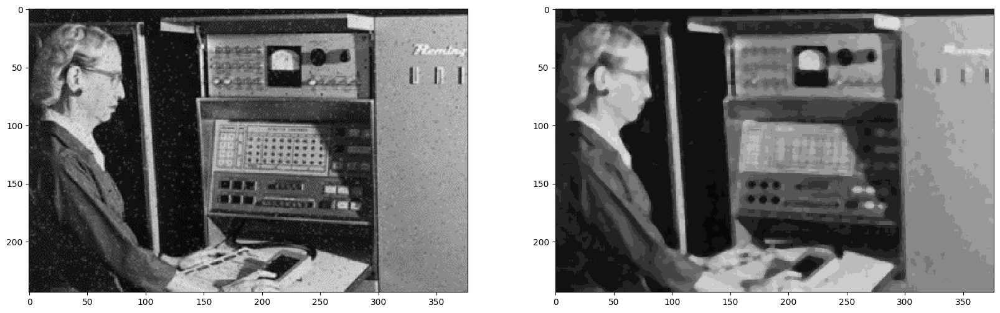

In [ ]:
# Median filter
img_gray_median = cv2.medianBlur(img_gray,5)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_median, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Morphological operation

### Dilation & Erosion

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/text.png', cv2.IMREAD_GRAYSCALE)

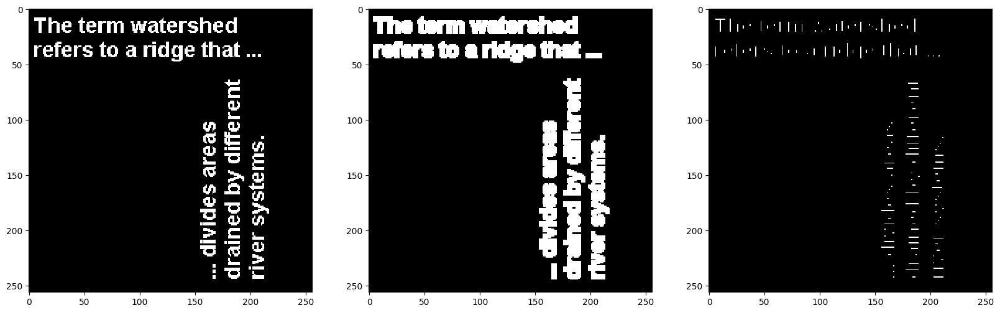

In [ ]:
kernel = np.ones((3,3),np.uint8)
dilate = cv2.dilate(img_gray, kernel,iterations = 1)
erode = cv2.erode(img_gray, kernel,iterations = 1)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(dilate, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(erode, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Openning

In [ ]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/snowflakes.png', cv2.IMREAD_GRAYSCALE)

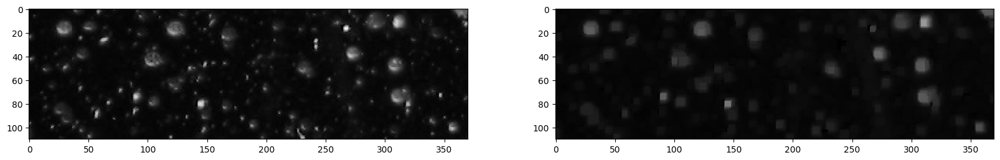

In [ ]:
kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(img_gray, cv2.MORPH_OPEN, kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(opening, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Closing

In [64]:
img_gray = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/circles.png', cv2.IMREAD_GRAYSCALE)

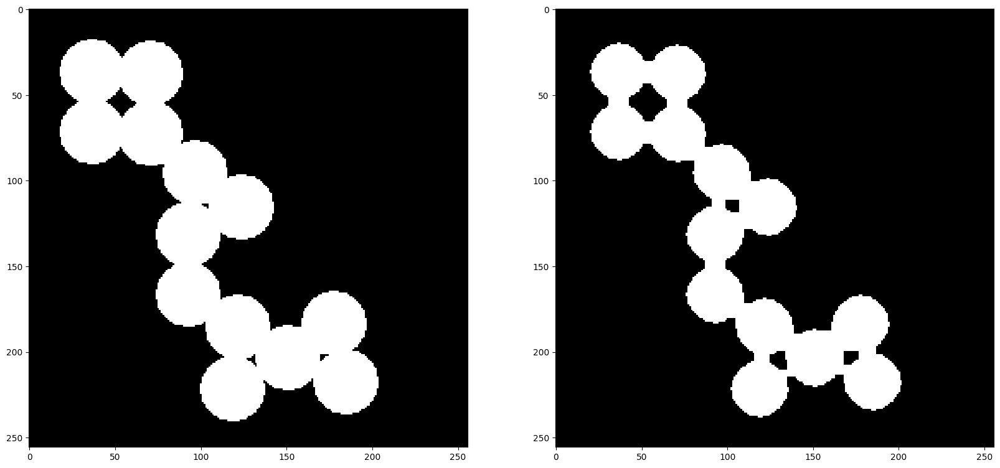

In [ ]:
kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(img_gray, kernel,iterations = 1)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(erosion, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

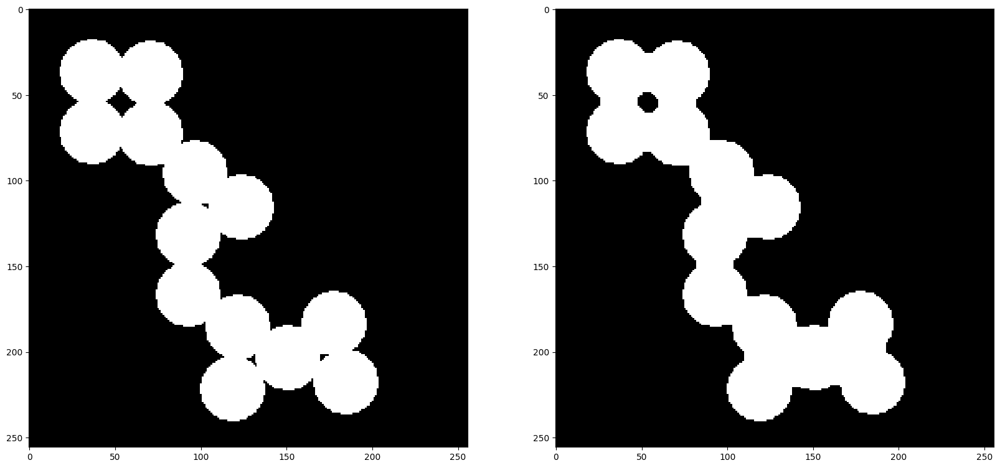

In [66]:
kernel = np.ones((5,5),np.uint8)
closing = cv2.morphologyEx(img_gray,cv2.MORPH_CLOSE,kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(closing, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Assignment 1: Try this tutorial with color image

In [ ]:
# Assignment 1: Try this tutorial with color image

In [ ]:
img_rgb = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/llama.jpg')
img_rgb = cv2.cvtColor(img_rgb,cv2.COLOR_BGR2RGB)

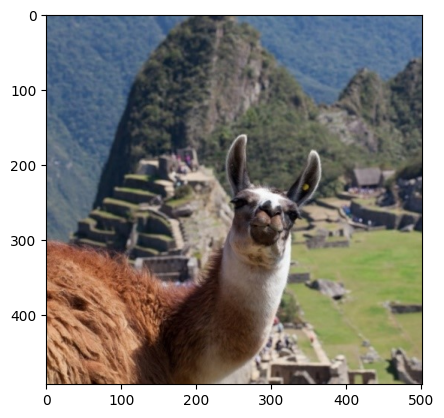

In [ ]:
plt.imshow(img_rgb)

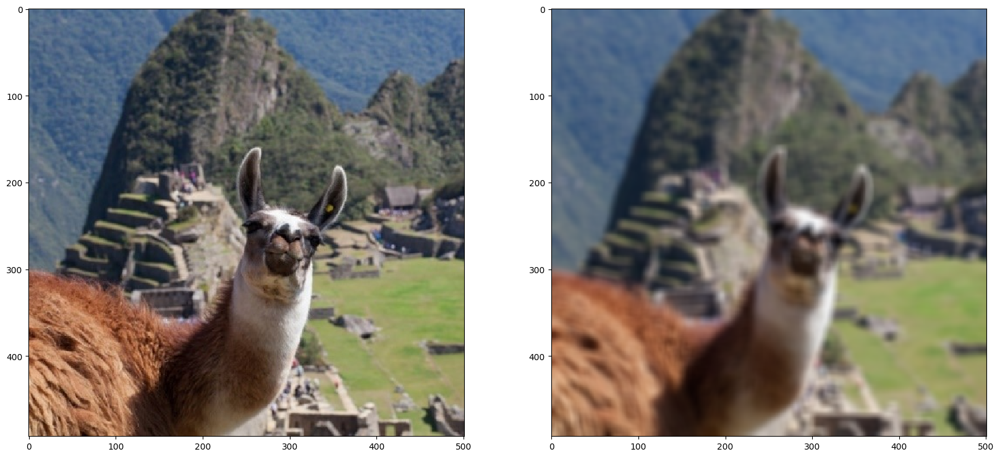

In [ ]:
# Create your own filter
kernel_size = 10

# Add you code here for creating a kernel matrix
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel /= (kernel_size * kernel_size)

img_filtered = cv2.filter2D(img_rgb, -1, kernel, cv2.BORDER_DEFAULT)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_rgb, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_filtered, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

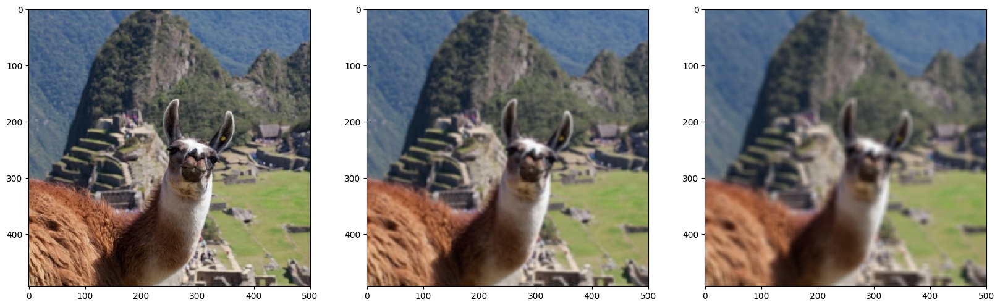

In [ ]:
# Box filter
img_blur_box1 = cv2.blur(img_rgb,(5,5))
img_blur_box2 = cv2.blur(img_rgb,(10,10))


# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_rgb, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_box1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_box2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

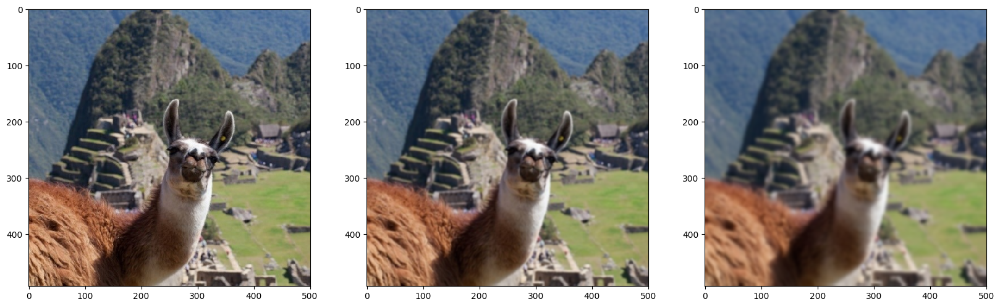

In [ ]:
#gaussian filter
img_blur_gauss1 = cv2.GaussianBlur(img_rgb, (5,5), 0)
img_blur_gauss2 = cv2.GaussianBlur(img_rgb, (15,15), 0)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_rgb, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_gauss1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_gauss2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

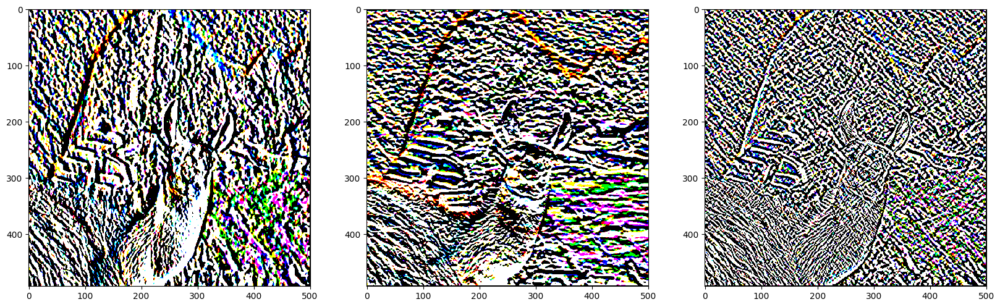

In [ ]:
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_rgb, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_rgb, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_rgb, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(sobelx, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(sobely, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(sobelxy, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

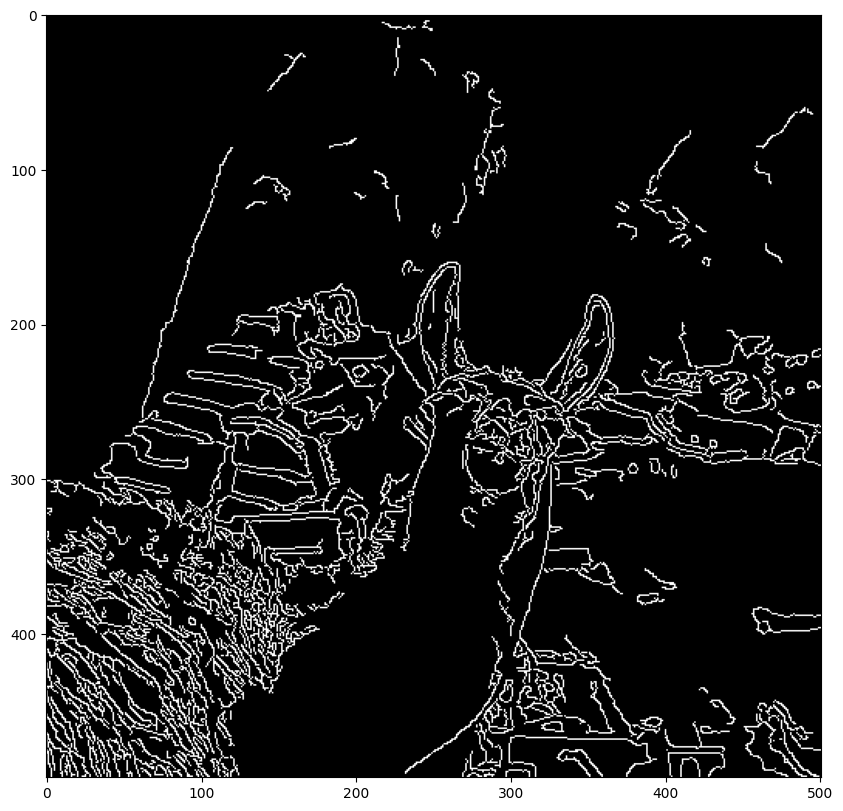

In [ ]:
# Canny Edge Detection
canny_edges = cv2.Canny(image=img_rgb, threshold1=100, threshold2=200) # Canny Edge Detection

# display the image
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.imshow(cv2.cvtColor(canny_edges, cv2.COLOR_BGR2RGB))
plt.show()

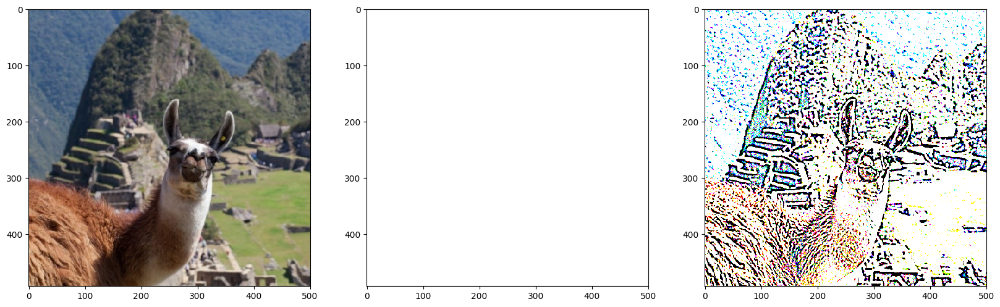

In [ ]:
img_blur_gauss = cv2.GaussianBlur(img_rgb, (5,5), 0)

gamma = 25

lap = cv2.Laplacian(img_blur_gauss, cv2.CV_64F)

img_sharp = img_rgb - gamma*lap

# display the images
lap_show = np.zeros(lap.shape)
cv2.normalize(lap, lap_show, 0, 255, cv2.NORM_MINMAX)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_rgb, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(lap_show, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_sharp, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Assignment 2: Counting the blood cells

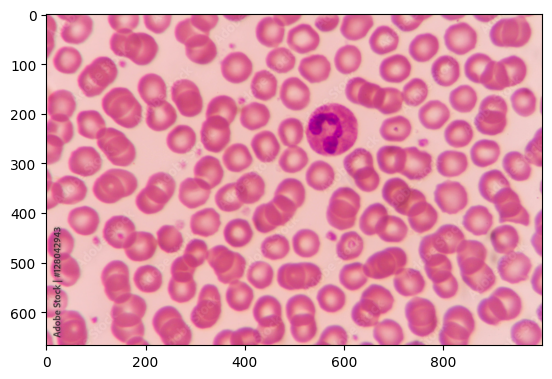

In [127]:
# Assignment 2: Counting the blood cells
# First, you will perform the thresholding to segment the blood cells as binary image
# Most of the time this segment is not perfect. You will have holes, islands, or unessesary segmentation
# Use cv2.findContours to get a bounding box around all detected contours.
# You can read how to detect contour after segmentation and get the bounding boxes from here:
# https://thinkinfi.com/find-contours-with-opencv-in-python/

img = cv2.imread('/content/drive/MyDrive/Computer vision/lab5/Images/blood1.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# Add your code here

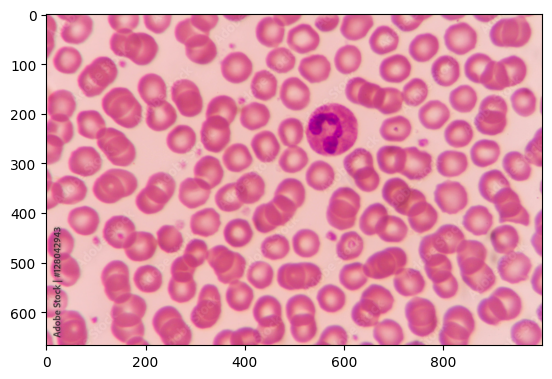

In [128]:
img_cpy = img.copy()
plt.imshow(cv2.cvtColor(img_cpy,cv2.COLOR_BGR2RGB))

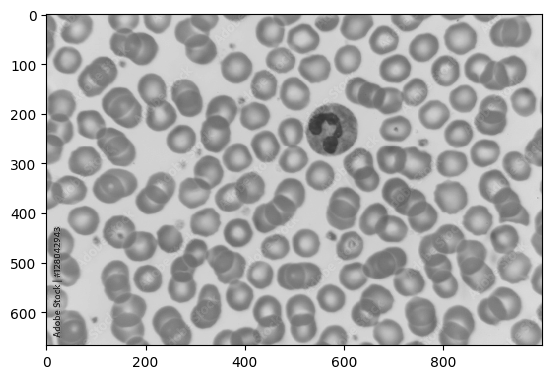

In [129]:
gray_img = cv2.cvtColor(img_cpy, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_img, cmap='gray', vmin = 0, vmax = 255,interpolation='none')

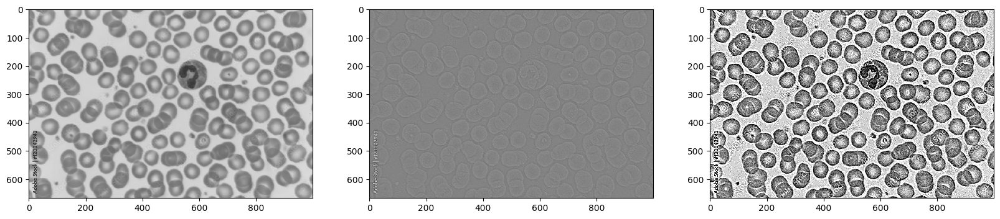

In [130]:
img_blur_gauss = cv2.GaussianBlur(gray_img, (5,5), 0)

gamma = 25

lap = cv2.Laplacian(img_blur_gauss, cv2.CV_64F)

img_sharp = gray_img - gamma*lap

# display the images
lap_show = np.zeros(lap.shape)
cv2.normalize(lap, lap_show, 0, 255, cv2.NORM_MINMAX)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(gray_img, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(lap_show, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_sharp, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [131]:
threshold_value = gray_img[100, 380]
print(threshold_value)

178


In [132]:
# Convert the grayscale image to binary (image binarization opencv python)
ret, binary_img = cv2.threshold(gray_img, threshold_value, 255, cv2.THRESH_BINARY)

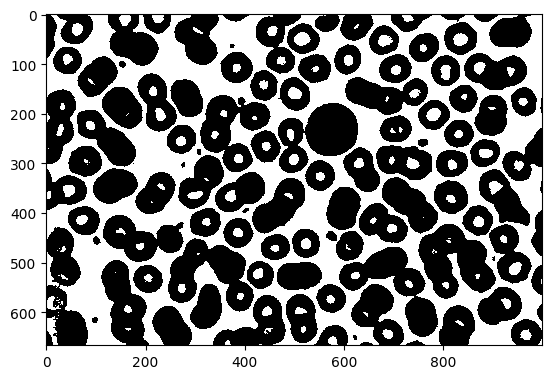

In [133]:
plt.imshow(binary_img, cmap='gray', vmin = 0, vmax = 255,interpolation='none')

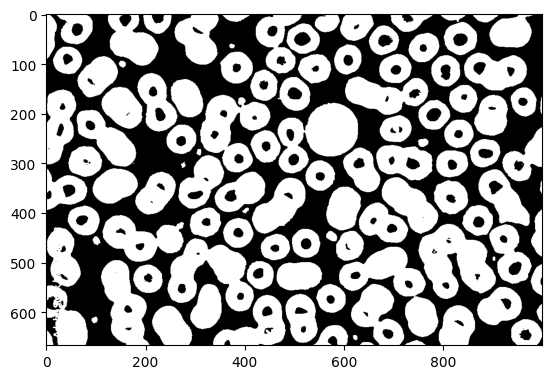

In [134]:
# Invert image
inverted_binary_img = ~ binary_img
plt.imshow(cv2.cvtColor(inverted_binary_img, cv2.COLOR_BGR2RGB))

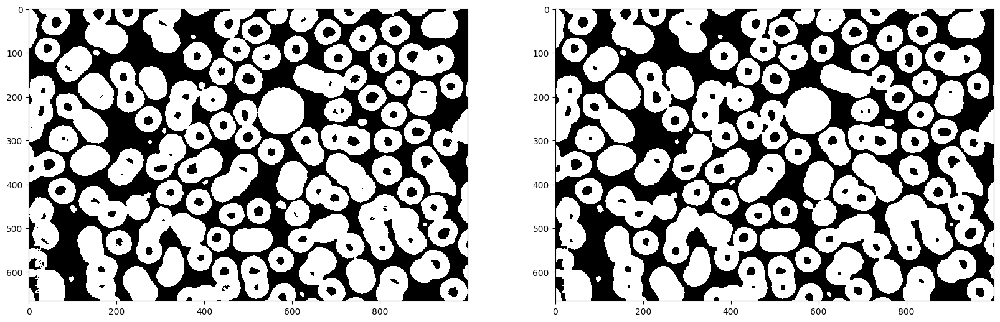

In [135]:
kernel = np.ones((5,5),np.uint8)
closing = cv2.morphologyEx(inverted_binary_img,cv2.MORPH_CLOSE,kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(inverted_binary_img, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(closing, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

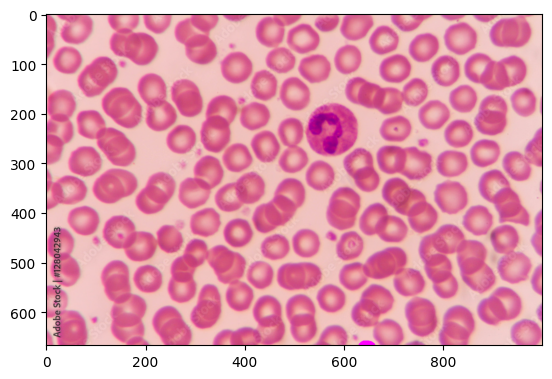

In [136]:
# Detect contours
# hierarchy variable contains information about the relationship between each contours
contours_list, hierarchy = cv2.findContours(closing,
                                       cv2.RETR_TREE,
                                       cv2.CHAIN_APPROX_SIMPLE) # Find contours

# Draw first contour
first_contour = 0
second_contour = 1

contour1 = cv2.drawContours(img, contours_list, first_contour,(255,0,255),5)
plt.imshow(cv2.cvtColor(contour1, cv2.COLOR_BGR2RGB))

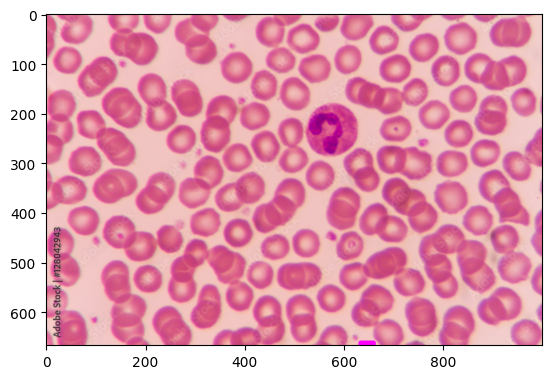

In [137]:
# Draw a bounding box around the first contour
x, y, w, h = cv2.boundingRect(contours_list[first_contour])
cv2.rectangle(contour1,(x,y), (x+w,y+h), (255,0,255), 5)
plt.imshow(cv2.cvtColor(contour1, cv2.COLOR_BGR2RGB))

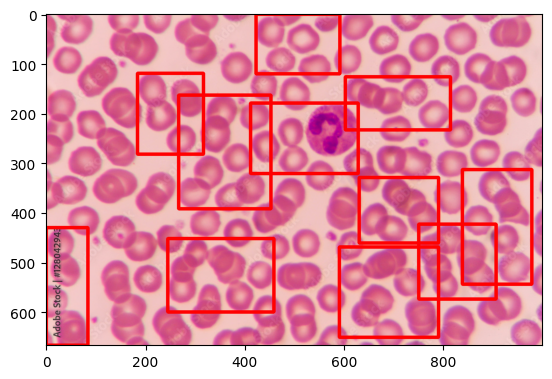

In [138]:
#Draw a bounding box around all detected contours
for c in contours_list:
    x, y, w, h = cv2.boundingRect(c)

    # Make sure contour area is large enough
    if (cv2.contourArea(c)) > 10000:
        cv2.rectangle(img_cpy, (x, y), (x + w, y + h), (0, 0, 255), 5)
plt.imshow(cv2.cvtColor(img_cpy, cv2.COLOR_BGR2RGB))

In [ ]:
home = np.array([[0, 0,  0,  0,  0,  0,  0,  0,0],
                 [0,96,101,115,138,144,164,172,0],
                 [0,48, 95,109,120,136,154,160,0],
                 [0,70, 84, 93,104,127,132,140,0],
                 [0,69, 74, 88, 91,101, 94,122,0],
                 [0,54, 46, 46, 53, 73, 94,106,0],
                 [0,50, 55, 60, 63, 66, 79, 99,0],
                 [0,46, 41, 22, 34, 55, 73, 71,0],
                 [0, 0,  0,  0,  0,  0,  0,  0,0]])

In [ ]:
from numpy import zeros_like, ravel, sort, multiply, divide, int8
def median_filter(gray_img, mask=3):
  # set image borders
  bd = int(mask / 2)
  # copy image size
  median_img = zeros_like(gray_img)
  for i in range(bd, gray_img.shape[0] - bd):
        for j in range(bd, gray_img.shape[1] - bd):
            # get mask according with mask
            kernel = ravel(gray_img[i - bd : i + bd + 1, j - bd : j + bd + 1])
            # calculate mask median
            median = sort(kernel)[int8(divide((multiply(mask, mask)), 2) + 1)]
            median_img[i, j] = median
  return median_img

In [ ]:
median_filter(home)

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,  48,  96, 109, 120, 138, 154, 154,   0],
       [  0,  84,  96, 109, 127, 138, 154, 154,   0],
       [  0,  70,  88,  95, 109, 127, 136, 132,   0],
       [  0,  69,  74,  88,  93, 101, 122, 106,   0],
       [  0,  54,  60,  63,  73,  91,  99,  94,   0],
       [  0,  46,  50,  53,  60,  73,  79,  79,   0],
       [  0,  41,  46,  41,  55,  63,  71,  71,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0]])

In [ ]:
import scipy.ndimage as A

In [ ]:
A.uniform_filter(home, size=3, mode='constant')

array([[ 10,  21,  34,  39,  44,  49,  53,  37,  19],
       [ 16,  37,  62,  75,  84,  95, 103,  72,  36],
       [ 23,  54,  89, 106, 120, 135, 147, 102,  52],
       [ 20,  48,  80,  95, 107, 117, 129,  88,  46],
       [ 21,  44,  69,  75,  85,  96, 109,  76,  40],
       [ 19,  38,  59,  63,  71,  79,  92,  66,  36],
       [ 16,  32,  46,  46,  52,  65,  79,  58,  30],
       [ 10,  21,  30,  30,  33,  40,  48,  35,  18],
       [  5,   9,  11,  10,  12,  17,  21,  15,   7]])